<h1><center> Action Recognition with CAM visualization </center> </h1>

<br>Author: Abidemi
<br>Dataset: Stanford-40 action
<br>Architecture: VGG19
<br>Input Image Size: 500x500x3
<br>Initial Learning Rate: .0001, decrease by a factor of 10 if no improvement to validation loss


This notebook implements action recognition CNN using Inception-ResNet-v2, and includes a Global Average Pooling layer followed by a 40-way softmax which uses categorical crossentropy.
The GAP layer makes it simple to visualize the class activation map in order to understand which parts of the image was significant in leading the model to the given prediction.

A few images downloaded from the web was also used to do inference in the wild at the bottom of this notebook.


In [1]:
import tensorflow as tf


# Check tensorflow version
print("Using Tensorflow %s\n" % (tf.__version__))

# Check to see if graphics card is doing OK memory-wise
!nvidia-smi

Using Tensorflow 2.0.0

Sat Mar 14 00:44:40 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.87.01    Driver Version: 418.87.01    CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:00:1E.0 Off |                    0 |
| N/A   26C    P0    23W / 300W |      0MiB / 16130MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                    

In [2]:
%load_ext tensorboard

In [3]:
from tensorflow.keras.metrics import top_k_categorical_accuracy

def top5(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=5)




In [4]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers

from sklearn import metrics
import math
import numpy as np
from tensorflow.keras.models       import Model


## Run this section if we are loading the previously trained model

from tensorflow.keras.models import load_model

from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input


dependencies = {
    'top5': top5
}


model =load_model('models/class_only/30_epochs.h5')

model.summary()

## Create Model Using ImageNet Weights

In [5]:
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input

pixels = 500
# Input pixel dimensions.  All training and test examples will be resized to (pixel, pixel, 3)
conv_base = VGG19(weights='imagenet', include_top=False, input_shape=(pixels,pixels,3))

conv_base.trainable = False

train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=10, zoom_range= [0.9,1.1])
test_datagen = ImageDataGenerator(rescale=1./255)

In [6]:
conv_base.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 500, 500, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 500, 500, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 500, 500, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 250, 250, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 250, 250, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 250, 250, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 125, 125, 128)     0     

In [7]:
model = models.Sequential()
model.add(conv_base)
model.add(layers.Conv2D(1024, (3, 3), padding="same", strides=(1, 1), activation="relu", name="ClassConv"))
model.add(layers.GlobalAveragePooling2D(name="GAP"))
model.add(layers.Dense(40, activation="softmax", name="class"))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 15, 15, 512)       20024384  
_________________________________________________________________
ClassConv (Conv2D)           (None, 15, 15, 1024)      4719616   
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 24,785,000
Trainable params: 4,760,616
Non-trainable params: 20,024,384
_________________________________________________________________


In [8]:
all_amp_layer_weights = model.layers[-1].get_weights()[0]

In [9]:
all_amp_layer_weights.shape

(1024, 40)

In [10]:
cam_shape = tuple(model.get_layer("ClassConv").output.get_shape().as_list()[1:])
cam_shape

(15, 15, 1024)

## Create train and test generators

In [11]:
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=10, zoom_range= [0.9,1.1])
test_datagen = ImageDataGenerator(rescale=1./255)

In [12]:
BATCH_SIZE = 32


train_generator = train_datagen.flow_from_directory("Stanford40/train", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical')
valid_generator = test_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)

y_true = valid_generator.classes

train_m = len(train_generator.classes)
valid_m = len(valid_generator.classes)

mapping = dict()
for activity, idx in train_generator.class_indices.items():
    mapping[idx] = activity

train_steps = math.ceil(train_m/BATCH_SIZE)
valid_steps = math.ceil(valid_m/BATCH_SIZE)



Found 6693 images belonging to 40 classes.
Found 2839 images belonging to 40 classes.


In [13]:
from tensorflow.keras.callbacks import ReduceLROnPlateau


filepath = "models/class_only/checkpoints/epoch_{epoch:02d}-{val_loss:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='min')

#callback = tf.keras.callbacks.EarlyStopping(monitor='classification_loss', patience=5)

logdir = "models/class_only/logs"

tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)


In [14]:
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=1e-4), metrics = ['acc'])


In [15]:
prev_epochs = 0
epochs = 15

In [16]:
history = model.fit_generator(train_generator, steps_per_epoch=train_steps, initial_epoch=prev_epochs, epochs=epochs, validation_data=valid_generator, validation_steps=valid_steps, callbacks=[tensorboard_callback, checkpoint])

Epoch 1/15
209/210 [============================>.] - ETA: 1s - loss: 3.3938 - acc: 0.1248
Epoch 00001: val_loss improved from inf to 3.06106, saving model to models/class_only/checkpoints/epoch_01-3.06.h5
210/210 [==============================] - 421s 2s/step - loss: 3.3922 - acc: 0.1251 - val_loss: 3.0611 - val_acc: 0.2258
Epoch 2/15
209/210 [============================>.] - ETA: 1s - loss: 2.8725 - acc: 0.2510
Epoch 00002: val_loss improved from 3.06106 to 2.74289, saving model to models/class_only/checkpoints/epoch_02-2.74.h5
210/210 [==============================] - 400s 2s/step - loss: 2.8709 - acc: 0.2521 - val_loss: 2.7429 - val_acc: 0.2871
Epoch 3/15
209/210 [============================>.] - ETA: 1s - loss: 2.6055 - acc: 0.3177
Epoch 00003: val_loss improved from 2.74289 to 2.50172, saving model to models/class_only/checkpoints/epoch_03-2.50.h5
210/210 [==============================] - 403s 2s/step - loss: 2.6057 - acc: 0.3182 - val_loss: 2.5017 - val_acc: 0.3487
Epoch 4/

In [24]:
prev_epochs = 15
epochs = 40

In [25]:
history = model.fit_generator(train_generator, steps_per_epoch=train_steps, initial_epoch=prev_epochs, epochs=40, validation_data=valid_generator, validation_steps=valid_steps)

Epoch 16/40
210/210 [==============================] - 417s 2s/step - loss: 1.7380 - acc: 0.5235 - val_loss: 1.7973 - val_acc: 0.5041
Epoch 17/40
210/210 [==============================] - 400s 2s/step - loss: 1.7020 - acc: 0.5349 - val_loss: 1.7931 - val_acc: 0.5100
Epoch 18/40
210/210 [==============================] - 403s 2s/step - loss: 1.6831 - acc: 0.5376 - val_loss: 1.7766 - val_acc: 0.5171
Epoch 19/40
210/210 [==============================] - 401s 2s/step - loss: 1.6497 - acc: 0.5485 - val_loss: 1.7740 - val_acc: 0.5097
Epoch 20/40
210/210 [==============================] - 401s 2s/step - loss: 1.6235 - acc: 0.5510 - val_loss: 1.7278 - val_acc: 0.5220
Epoch 21/40
210/210 [==============================] - 400s 2s/step - loss: 1.6112 - acc: 0.5560 - val_loss: 1.7828 - val_acc: 0.5037
Epoch 22/40
210/210 [==============================] - 403s 2s/step - loss: 1.5952 - acc: 0.5595 - val_loss: 1.6961 - val_acc: 0.5284
Epoch 23/40
210/210 [==============================] - 403s 2s

In [36]:
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=1e-5), metrics = ['acc'])

In [37]:
prev_epochs = 40
epochs = 60

In [38]:
history = model.fit_generator(train_generator, steps_per_epoch=train_steps, initial_epoch=prev_epochs, epochs=epochs, validation_data=valid_generator, validation_steps=valid_steps, callbacks=[tensorboard_callback, checkpoint])

Epoch 41/60
209/210 [============================>.] - ETA: 1s - loss: 1.2171 - acc: 0.6706
Epoch 00041: val_loss improved from 1.81076 to 1.52014, saving model to models/class_only/checkpoints/epoch_41-1.52.h5
210/210 [==============================] - 426s 2s/step - loss: 1.2164 - acc: 0.6709 - val_loss: 1.5201 - val_acc: 0.5763
Epoch 42/60
209/210 [============================>.] - ETA: 1s - loss: 1.2119 - acc: 0.6715
Epoch 00042: val_loss did not improve from 1.52014
210/210 [==============================] - 401s 2s/step - loss: 1.2108 - acc: 0.6717 - val_loss: 1.5207 - val_acc: 0.5734
Epoch 43/60
209/210 [============================>.] - ETA: 1s - loss: 1.2044 - acc: 0.6756
Epoch 00043: val_loss did not improve from 1.52014
210/210 [==============================] - 400s 2s/step - loss: 1.2053 - acc: 0.6759 - val_loss: 1.5243 - val_acc: 0.5724
Epoch 44/60
209/210 [============================>.] - ETA: 1s - loss: 1.2083 - acc: 0.6711
Epoch 00044: val_loss did not improve from 1.

In [ ]:
score = model.evaluate_generator(valid_generator, 142)

In [ ]:
score

## Saving the Model

In [63]:
model.save("models/class_only/VGG19-60_epochs.h5")

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
ClassConv (Conv2D)           (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 14,197,800
Non-trainable params: 54,336,736
_________________________________________________________________


## Plotting Loss and Acc

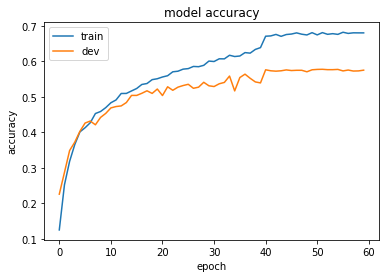

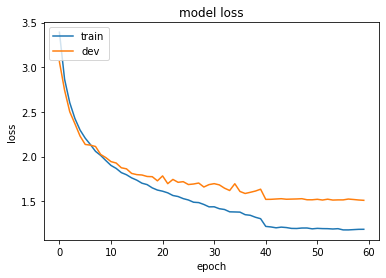

In [41]:
import matplotlib.pyplot as plt

plt.plot(hist['acc'])
plt.plot(hist['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(hist['loss'])
plt.plot(hist['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()

In [21]:
h = dict()
h['acc'] = history.history['acc']
h['val_acc'] = history.history['val_acc']
h['loss'] = history.history['loss']
h['val_loss'] = history.history['val_loss']


In [27]:
g = dict()
g['acc'] = history.history['acc']
g['val_acc'] = history.history['val_acc']
g['loss'] = history.history['loss']
g['val_loss'] = history.history['val_loss']

In [39]:
i = dict()
i['acc'] = history.history['acc']
i['val_acc'] = history.history['val_acc']
i['loss'] = history.history['loss']
i['val_loss'] = history.history['val_loss']

In [40]:
hist = dict()

for key in ['acc', 'val_acc', 'loss', 'val_loss']:
    hist[key] = h[key] + g[key] + i[key]

hist



{'acc': [0.12505603,
  0.2520544,
  0.31824294,
  0.36560586,
  0.4013148,
  0.41296878,
  0.4270133,
  0.45301062,
  0.45868817,
  0.4695951,
  0.4833408,
  0.49125952,
  0.5094875,
  0.50963694,
  0.5166592,
  0.52353203,
  0.5348872,
  0.53757656,
  0.5484835,
  0.5510235,
  0.555954,
  0.5595398,
  0.57059616,
  0.57223964,
  0.57806665,
  0.57956076,
  0.58568656,
  0.5849395,
  0.58882415,
  0.6007769,
  0.59958166,
  0.6072016,
  0.60705215,
  0.617212,
  0.6136262,
  0.6151203,
  0.6246825,
  0.6231884,
  0.6336471,
  0.638727,
  0.67085016,
  0.6717466,
  0.6759301,
  0.6705513,
  0.6756313,
  0.67697597,
  0.680263,
  0.67652774,
  0.674436,
  0.6808606,
  0.6745854,
  0.68101,
  0.6762289,
  0.6780218,
  0.6760795,
  0.6820559,
  0.6787689,
  0.68041235,
  0.680263,
  0.680263],
 'val_acc': [0.22578372,
  0.28707293,
  0.34871432,
  0.37231418,
  0.40295878,
  0.4262064,
  0.4318422,
  0.4212751,
  0.44205707,
  0.45332864,
  0.46882704,
  0.47270167,
  0.47446284,
  0.48397

## Confusion Matrix

In [42]:
cam_shape = tuple(model.get_layer("ClassConv").output.get_shape().as_list()[1:])


# custom generator
def multiple_outputs(generator, image_dir, batch_size, image_size):
    gen = generator.flow_from_directory(
        image_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical', shuffle=False)
    
    while True:
        gnext = gen.next()
        # return image batch and 3 sets of lables
        #yield gnext[0], [np.zeros((gnext[1].shape[0], 14, 14, 1024)), gnext[1]]
        yield gnext[0], [np.zeros((gnext[1].shape[0], *cam_shape)), gnext[1]]

In [43]:
BATCH_SIZE = 12

pixels = 500
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=10, zoom_range= [0.9,1.1])
test_datagen = ImageDataGenerator(rescale=1./255)

valid_generator = multiple_outputs(test_datagen, 
                                   image_dir="Stanford40/test", 
                                   batch_size=BATCH_SIZE, 
                                   image_size=pixels)

valid_temp = test_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)
y_true = valid_temp.classes

valid_m = len(valid_temp.classes)

mapping = dict()
for activity, idx in valid_temp.class_indices.items():
    mapping[idx] = activity


valid_steps = math.ceil(valid_m/BATCH_SIZE)


Found 2839 images belonging to 40 classes.


In [45]:
BATCH_SIZE = 12

valid_generator = test_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)

y_true = valid_generator.classes

valid_m = len(valid_generator.classes)

mapping = dict()
for activity, idx in train_generator.class_indices.items():
    mapping[idx] = activity

valid_steps = math.ceil(valid_m/BATCH_SIZE)


Found 2839 images belonging to 40 classes.


In [46]:
len(y_true)

2839

In [47]:
predictions = model.predict_generator(valid_generator, valid_steps)

In [48]:
predictions = predictions.argmax(axis=1)

In [49]:
len(predictions)

2839

In [51]:
(y_true == predictions).mean()

0.5752025361042621

In [52]:
mapping[5]

'cooking'

In [53]:
matrix = metrics.confusion_matrix(y_true, predictions)

## Plot confusion matrix

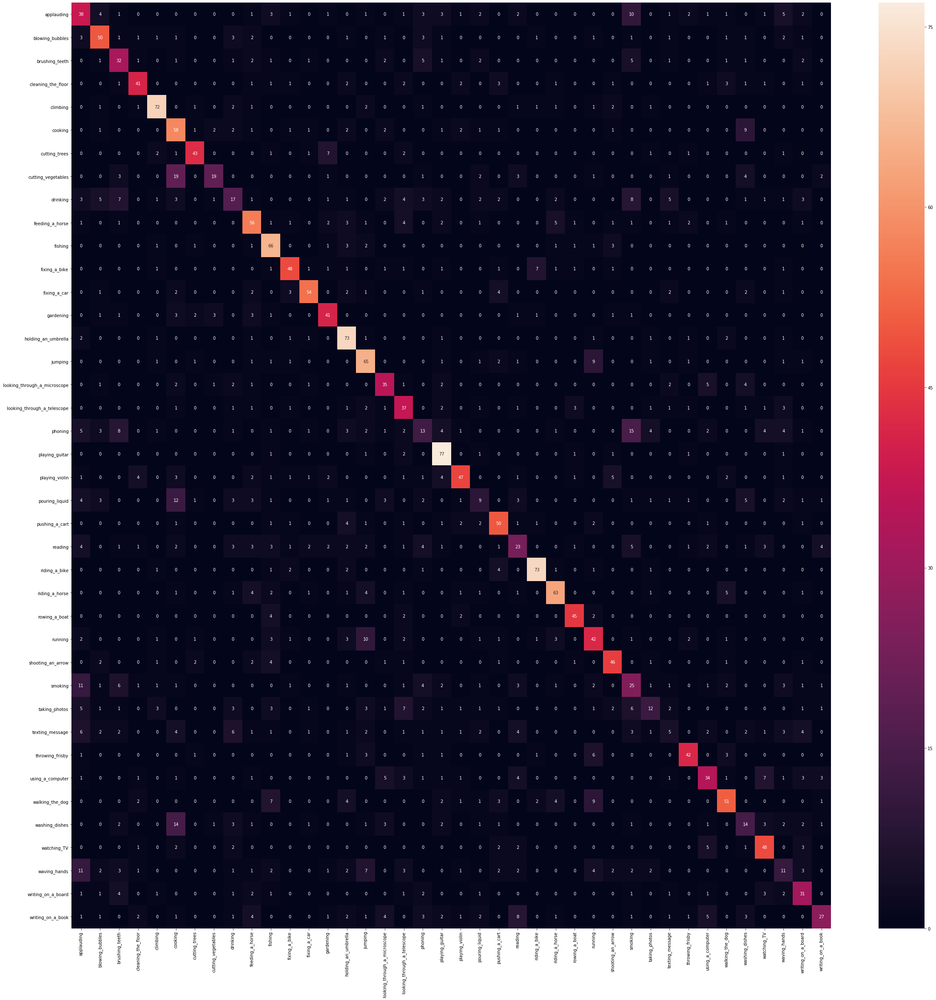

In [54]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

df_cm = pd.DataFrame(matrix, index = [mapping[i] for i in range(40)], columns = [mapping[i] for i in range(40)])
plt.figure(figsize = (40, 40))
sn.heatmap(df_cm, annot=True)

In [55]:
import pickle
with open('VGG19-60_epochs-history.txt', 'wb') as file_pi:
    pickle.dump(hist, file_pi)


## Predicting from own image

In [56]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

def predict_image(file, model, mapping):
    
    # load an image from file
    image = load_img(file, target_size=(224, 224))
    image = img_to_array(image)
    image = image.reshape((1,image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    
    cam, yhat = model.predict(image)
    print(cam.shape)
    print(yhat.shape)
    category = np.argmax(yhat)
    return mapping[category]


In [57]:
all_amp_layer_weights=model.layers[-1].get_weights()[0]

In [58]:
all_amp_layer_weights.shape

(1024, 40)

In [59]:
final_model = Model(inputs = model.input, 
                  outputs = (model.get_layer("ClassConv").output, model.get_layer("class").output))
            
final_model.summary()


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19_input (InputLayer)     [(None, 500, 500, 3)]     0         
_________________________________________________________________
vgg19 (Model)                (None, 15, 15, 512)       20024384  
_________________________________________________________________
ClassConv (Conv2D)           (None, 15, 15, 1024)      4719616   
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 24,785,000
Trainable params: 4,760,616
Non-trainable params: 20,024,384
_________________________________________________________________


In [60]:
pixels = final_model.input.get_shape().as_list()[1]
pixels

500

In [61]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

def predict(img_path, model, all_amp_layer_weights):
    
    # Load and preprocess image
    img = image.load_img(img_path, target_size=(pixels,pixels))
    
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    
    processed_input = preprocess_input(x)
    
    # Run model's prediction to output from last Conv Layer + category prediction
    last_conv_output, pred_vec = final_model.predict(processed_input)
    # Only 1 training example, so remove batch dimension
    last_conv_output = np.squeeze(last_conv_output)

    # Get category with highest probability
    pred = np.argmax(pred_vec)
    
    scale = pixels / last_conv_output.shape[0]
    filters = last_conv_output.shape[2]
    
    # Rescale to input image sizederstanding was it's reserved for the fi
    mat_for_mult = scipy.ndimage.zoom(last_conv_output, (scale,scale,1), order=1)
    
    # Get the weights associated with the predicted class
    amp_layer_weights = all_amp_layer_weights[:, pred]
    
    # Weighted sum of the activation maps for the predicted class.
    # Then resize back to original image size.
    final_output = np.dot(mat_for_mult.reshape((pixels*pixels, filters)), amp_layer_weights).reshape(pixels,pixels)
    
    return final_output, mapping[pred]
    

.........................

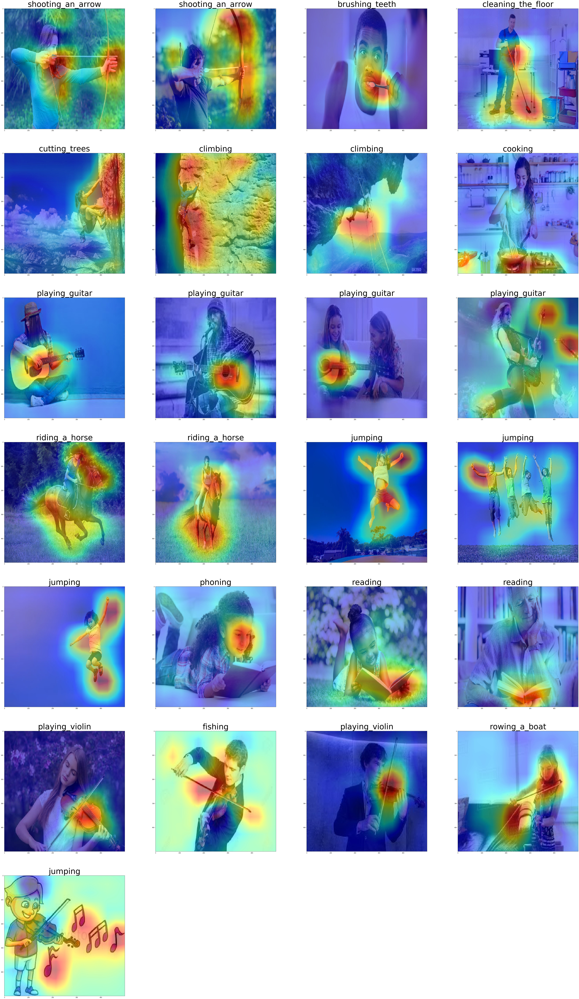

In [62]:
import matplotlib.pyplot as plt
import scipy
import glob

from tensorflow.keras.preprocessing import image

# Images downloaded from internet search engine to try out activity classification
# Images are under images/ directory 
image_dir = "images/"
pattern  = image_dir + "*"
test_images = sorted(glob.glob(pattern))

# Details for the grid size
columns = 4
rows = math.ceil(len(test_images) / columns)
fig = plt.figure(figsize=(80, 20 * rows))

for i, image_name in enumerate(test_images):

    # Progress report
    print(".", end = '')
    image_path = image_dir + image_name
    
    ax = fig.add_subplot(rows, columns, i+1)

    # Load and display original image
    img = tf.keras.preprocessing.image.load_img(image_name, target_size=(pixels,pixels))
    plt.imshow(img)
    
    # Run forward pass to get the Class Activity Map and the predicted class
    cam, pred = predict(image_name, model, all_amp_layer_weights)
    
    # Display class activation map
    plt.imshow(cam, cmap='jet', alpha=0.5)
    # Set title to that of predicted class
    ax.set_title(pred, fontsize =60)
    
    
plt.show()

In [55]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))